In [5]:
# import packages
from astropy.io import fits
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import pandas as pd

from lmfit import Model, fit_report
from lmfit.models import LinearModel

import warnings
warnings.filterwarnings('ignore')

import os
notebook_path = os.path.abspath('h2_h3p_vel_compare.ipynb' + "/../")
imgpath = os.path.join(os.path.dirname(notebook_path), 'plots/vorf')


h2_vorf = fits.open('h2_vorf.fits', ignore_missing_end=True)[0].data
h3p_vorf = fits.open('h3p_vorf.fits', ignore_missing_end=True)[0].data
h2_verr = fits.open('h2_verr.fits', ignore_missing_end=True)[0].data
h3p_verr = fits.open('h3p_verr.fits', ignore_missing_end=True)[0].data
h2_int = fits.open('h2_int_shifted.fits', ignore_missing_end=True)[0].data
h3p_int = fits.open('h3p_int_shifted.fits', ignore_missing_end=True)[0].data
ref_sun = fits.open('ref_sun.fits', ignore_missing_end=True)[0].data

cmlsel = pd.read_csv('cml-sel.txt', sep='\s+', header=None)
cml = cmlsel[3].to_numpy()
sel = cmlsel[4].to_numpy()

vmp = 3.41*np.sin((185-cml)*(np.pi/180))*np.cos((sel)*(np.pi/180))

h2_vorf[h2_verr > 4] = np.nan
h3p_vorf[h3p_verr > 4] = np.nan

h2_vorf[h2_vorf > 8] = np.nan
h3p_vorf[h3p_vorf > 8] = np.nan
h2_vorf[h2_vorf < -8] = np.nan
h3p_vorf[h3p_vorf < -8] = np.nan

h2_vorf[:,:20] = np.nan
h3p_vorf[:,:20] = np.nan
h2_vorf[:,280:] = np.nan
h3p_vorf[:,280:] = np.nan

h2_verr[np.isnan(h2_vorf)] = np.nan
h3p_verr[np.isnan(h3p_vorf)] = np.nan
h2_int[np.isnan(h2_vorf)] = np.nan
h3p_int[np.isnan(h3p_vorf)] = np.nan

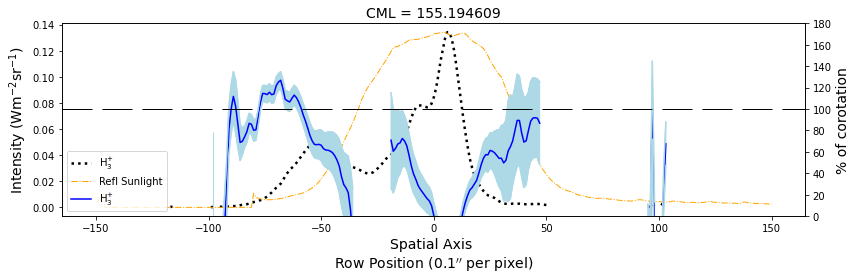

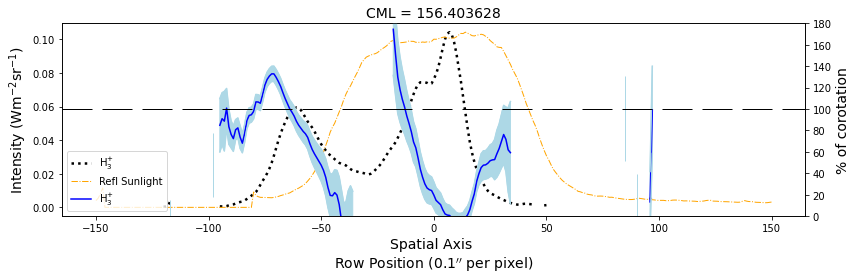

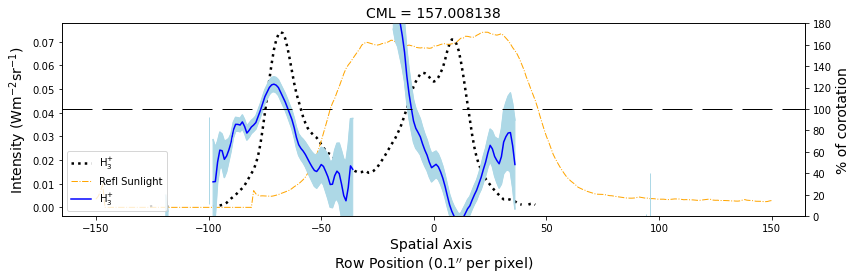

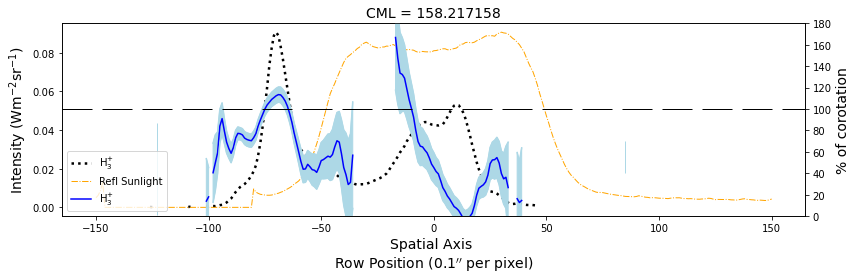

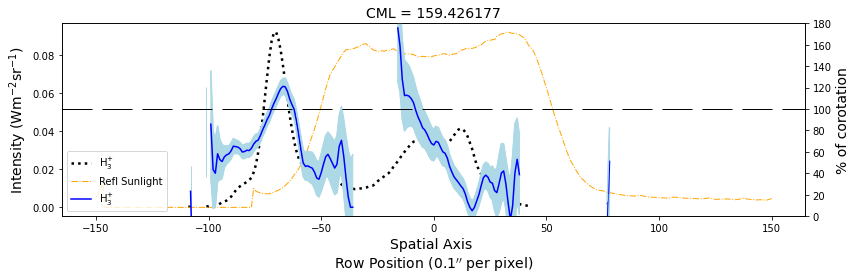

...

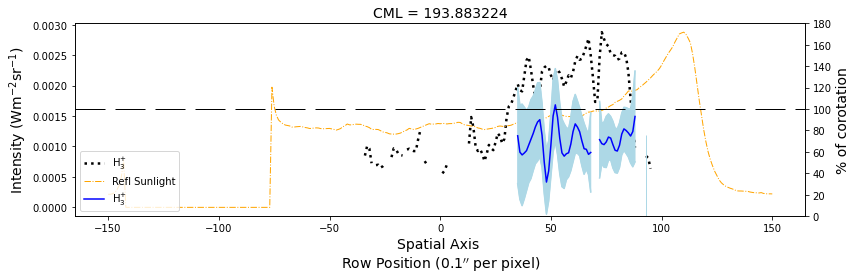

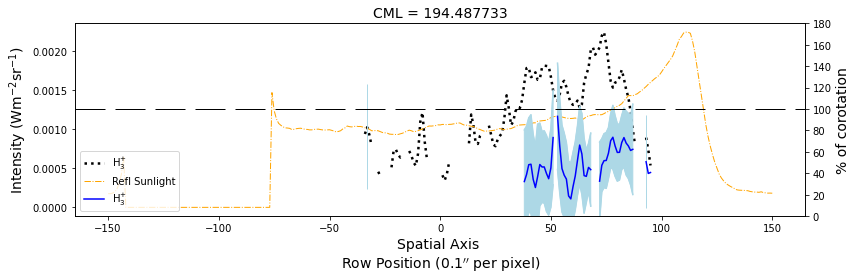

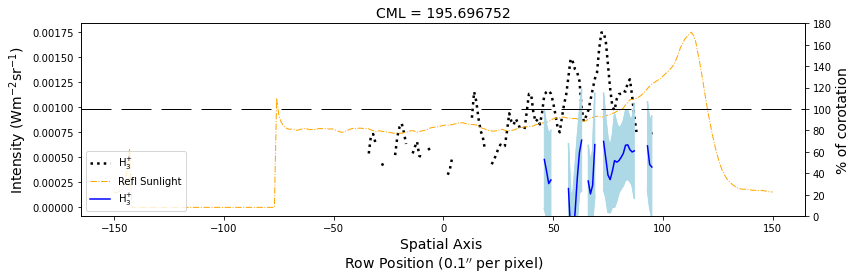

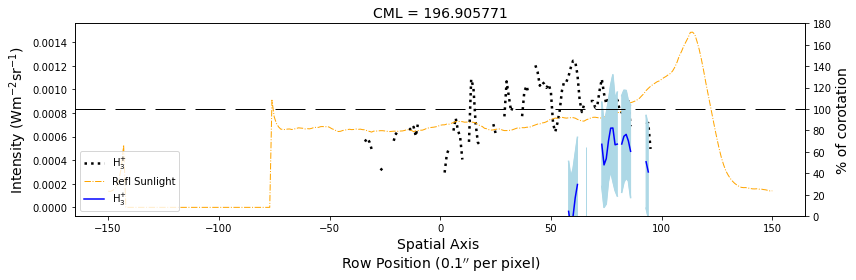

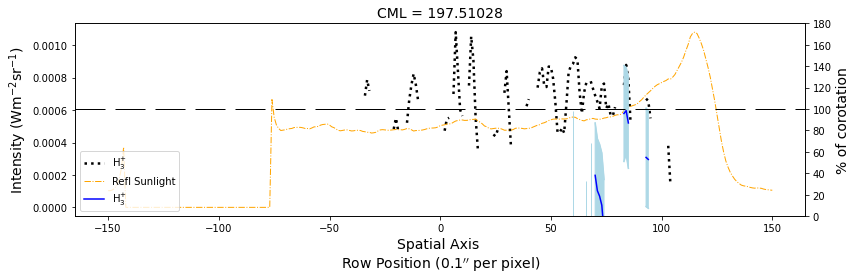

In [6]:
ang_diam = 40.58867
ang_diam/(0.1)
limb_vel = 12.572
vel_slope = limb_vel * 2 / (ang_diam/(0.1))

x = np.linspace(-150,150,301)
rot_rate = vel_slope * x
rot_rate = rot_rate - rot_rate[150]

a2 = h2_vorf*(-1)
b2 = h3p_vorf*(-1)

c2 = b2 - a2

errc2 = np.sqrt((h3p_verr)**2 + (h2_verr)**2)

for i in range(len(h3p_vorf)):
# for i in range(17, 18):
    if i not in (0,15,16,37):  
        xnew = np.linspace(-150,150,301)
        
        int2 = (ref_sun/np.nanmax(ref_sun[i])*np.nanmax(h3p_int[i]))
    
        vorf = (b2[i]-vmp[i])/(-rot_rate-vmp[i])
        vorfmax = ((b2[i]-vmp[i]+h3p_verr[i])/(-rot_rate-vmp[i]))*100
        vorfmin = ((b2[i]-vmp[i]-h3p_verr[i])/(-rot_rate-vmp[i]))*100
        
        vorf[np.abs(-rot_rate-vmp[i]) < 2*(h3p_verr[i])] = np.nan
        vorfmax[np.isnan(vorf)] = np.nan
        vorfmin[np.isnan(vorf)] = np.nan
        
        
        fig, ax = plt.subplots(figsize = (12, 4))
        plt.title('CML = '+ str(cml[i]), fontsize=14)
    
        ax2 = ax.twinx()
        ax.plot(xnew, h3p_int[i], color='k', ls=':', label='H$_3^{+}$', lw=2.5)
        ax.plot(xnew, int2[i], color='orange', ls='-.', label='Refl Sunlight', lw=1)
        
        ax2.plot(xnew, vorf*100, color='blue', label='H$_3^{+}$')
        ax2.plot(xnew, vorfmax, color='lightblue')
        ax2.plot(xnew, vorfmin, color='lightblue')
        ax2.fill_between(xnew, vorfmin, vorfmax, color='lightblue')
#         ax2.errorbar(xnew, (a2[i]-vmp[i])/(-rot_rate-vmp[i]), yerr=h2_verr[i], color='red', ecolor='lightsalmon', label='H$_2$')
#         ax2.errorbar(xnew, vorf, yerr=h3p_verr[i]/(-rot_rate-vmp[i]), color='blue', ecolor='lightblue', label='H$_3^{+}$')
#         ax2.errorbar(xnew, vorf, yerr=h3p_verr[i]/(-rot_rate-vmp[i]), color='red', ecolor='lightsalmon', label='H$_3^{+}$')
#         ax2.plot(-rot_rate-vmp[i], color='black', ls='dashed', dashes=(30, 10), lw=1)
#         ax2.errorbar(xnew, c2[i], yerr=errc2[i], color='green', ecolor='lightgreen', label='H$_3^{+}$-H$_2$')
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)

        # secondary y-axis label
#         ax2.set_ylabel('V$_{\mathrm{orf}}$ (km/s)', fontsize=14)
        ax2.set_ylabel('% of corotation', fontsize=14)
        
#         plt.figure(figsize=(12,4))
#         plt.plot(a2[num], label='H2')
#         plt.plot(b2[num], label='H3+')
#         plt.plot(xnew, int2[i], color='teal', ls='-', label='H$_3^{+}$ - Int')
#         plt.errorbar(xnew, a2[i], yerr=h2_verr[i], color='red', ecolor='gray', label='H$_2$')
#         plt.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='blue', ecolor='lightblue', label='H$_3^{+}$')
        plt.axhline(y=vmp[i]-vmp[i], xmin=0, xmax=1, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.axhline(y=100, xmin=0, xmax=1, color='black', ls='dashed', dashes=(30, 10), lw=1)
#         plt.xlim(-15,0)
        plt.ylim(0,180)
#         plt.xlabel('Spatial Axis \nRaw Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
#         plt.ylabel('V$_{\mathrm{orf}}$ (km/s)', fontsize=14)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=3)
        
        plt.tight_layout()
        plt.savefig(imgpath+'/h3p_percent_corotation_fr'+str(i)+'.pdf', dpi=400, bbox_inches='tight', facecolor='white')

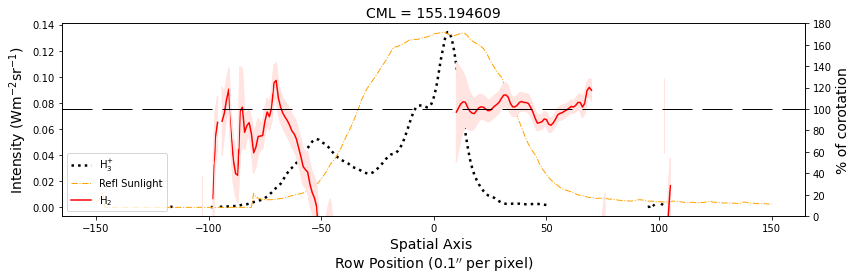

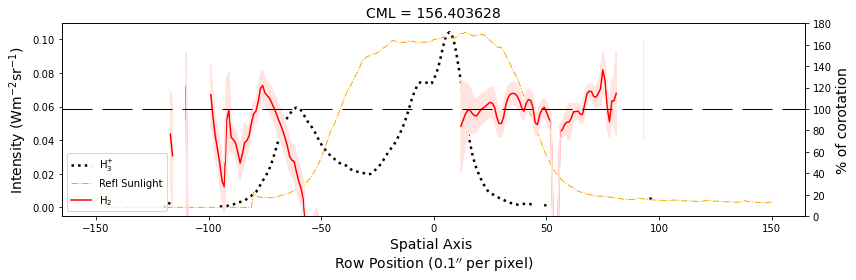

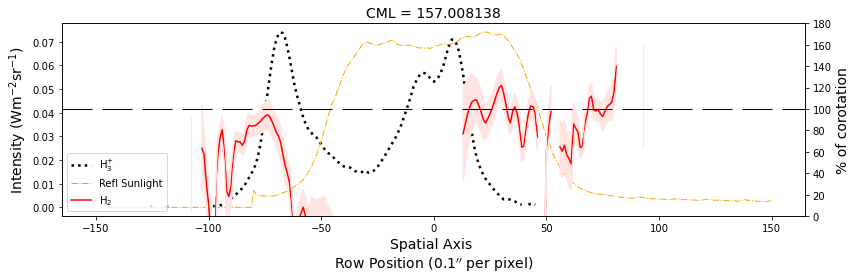

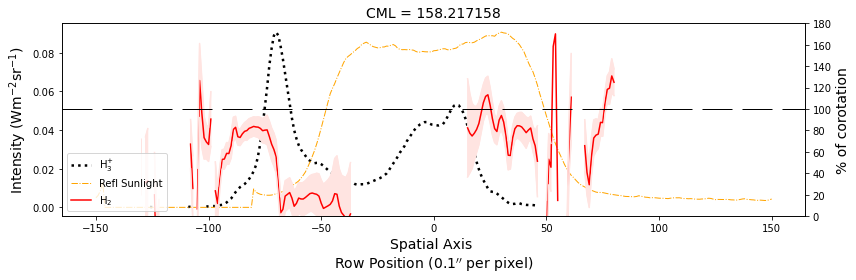

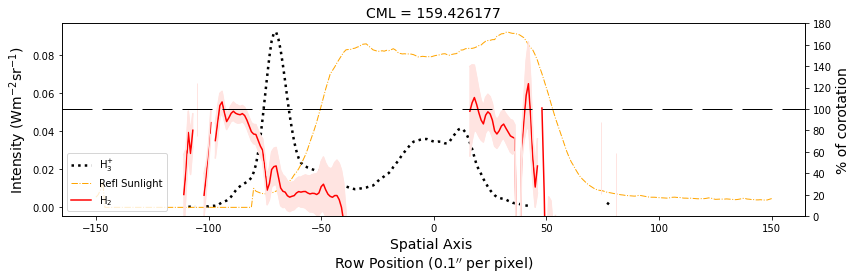

...

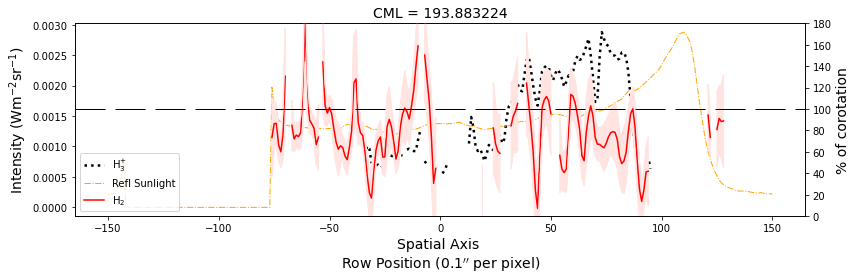

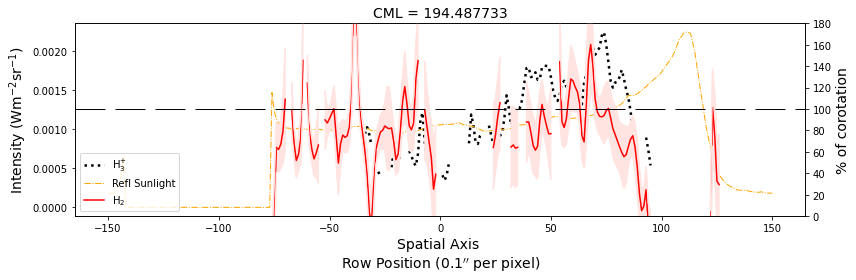

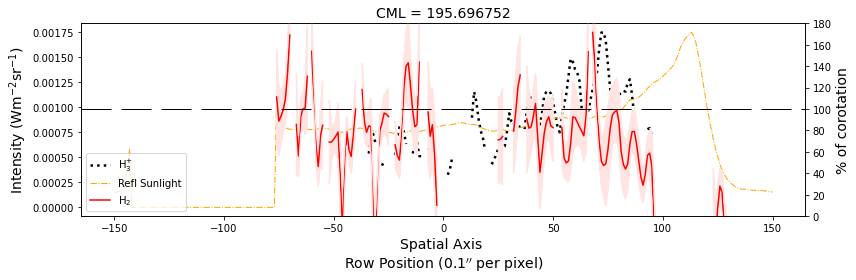

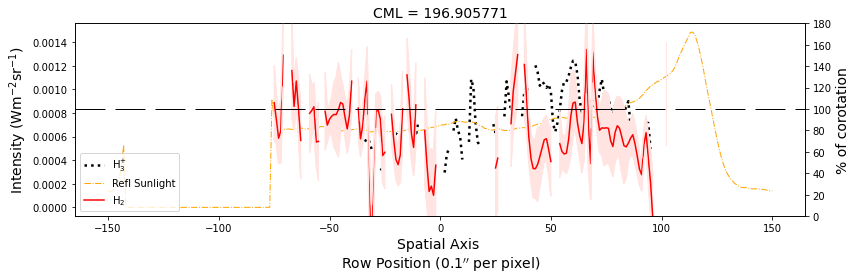

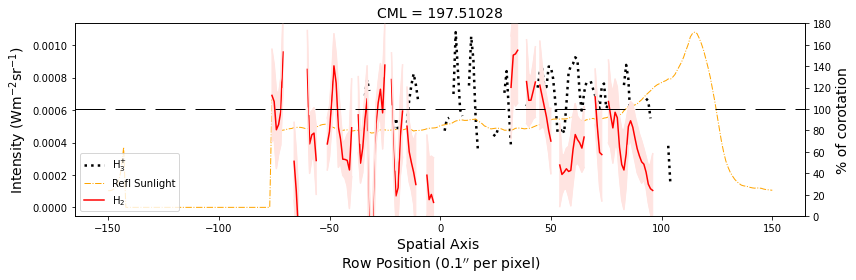

In [7]:
for i in range(len(h2_vorf)):
# for i in range(17, 18):
    if i not in (0,15,16,37):  
        xnew = np.linspace(-150,150,301)
        
        int2 = (ref_sun/np.nanmax(ref_sun[i])*np.nanmax(h3p_int[i]))
    
        vorf = (a2[i]-vmp[i])/(-rot_rate-vmp[i])
        vorfmax = ((a2[i]-vmp[i]+h2_verr[i])/(-rot_rate-vmp[i]))*100
        vorfmin = ((a2[i]-vmp[i]-h2_verr[i])/(-rot_rate-vmp[i]))*100
        
        vorf[np.abs(-rot_rate-vmp[i]) < 2*(h2_verr[i])] = np.nan
        vorfmax[np.isnan(vorf)] = np.nan
        vorfmin[np.isnan(vorf)] = np.nan
        
        fig, ax = plt.subplots(figsize = (12, 4))
        plt.title('CML = '+ str(cml[i]), fontsize=14)
        
        # create a second axis
        ax2 = ax.twinx()
        
        ax.plot(xnew, h3p_int[i], color='k', ls=':', label='H$_3^{+}$', lw=2.5)
        ax.plot(xnew, int2[i], color='orange', ls='-.', label='Refl Sunlight', lw=1)
        
        ax2.plot(xnew, vorf*100, color='red', label='H$_2$')        
        ax2.plot(xnew, vorfmax, color='mistyrose')
        ax2.plot(xnew, vorfmin, color='mistyrose')
        ax2.fill_between(xnew, vorfmin, vorfmax, color='mistyrose')
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)

        # secondary y-axis label
#         ax2.set_ylabel('V$_{\mathrm{orf}}$ (km/s)', fontsize=14)
        ax2.set_ylabel('% of corotation', fontsize=14)
        
#         plt.figure(figsize=(12,4))
#         plt.plot(a2[num], label='H2')
#         plt.plot(b2[num], label='H3+')
#         plt.plot(xnew, int2[i], color='teal', ls='-', label='H$_3^{+}$ - Int')
#         plt.errorbar(xnew, a2[i], yerr=h2_verr[i], color='red', ecolor='gray', label='H$_2$')
#         plt.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='blue', ecolor='lightblue', label='H$_3^{+}$')
        plt.axhline(y=vmp[i]-vmp[i], xmin=0, xmax=1, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.axhline(y=100, xmin=0, xmax=1, color='black', ls='dashed', dashes=(30, 10), lw=1)
#         plt.xlim(-15,0)
        plt.ylim(0,180)
#         plt.xlabel('Spatial Axis \nRaw Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
#         plt.ylabel('V$_{\mathrm{orf}}$ (km/s)', fontsize=14)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=3)
        
        plt.tight_layout()
        plt.savefig(imgpath+'/h2_percent_corotation_fr'+str(i)+'.pdf', dpi=400, bbox_inches='tight', facecolor='white')

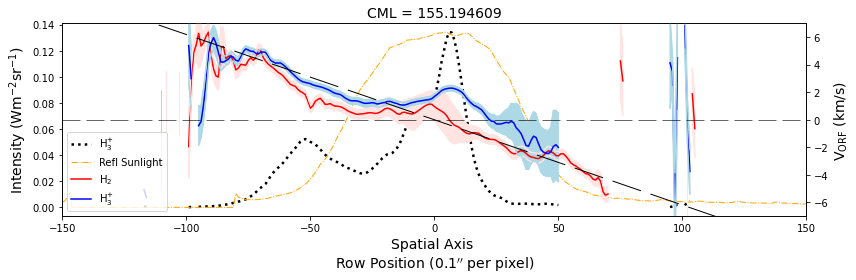

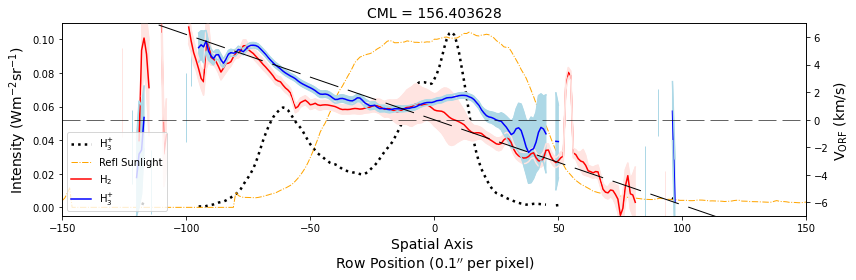

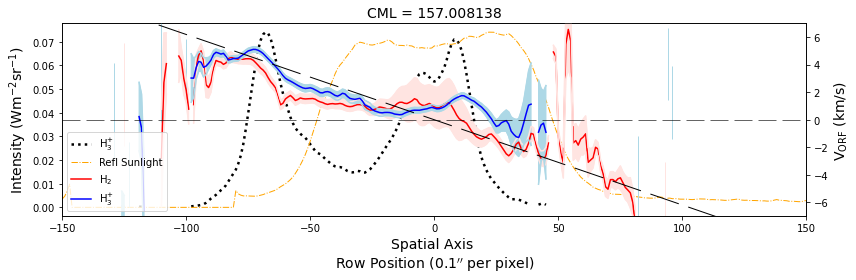

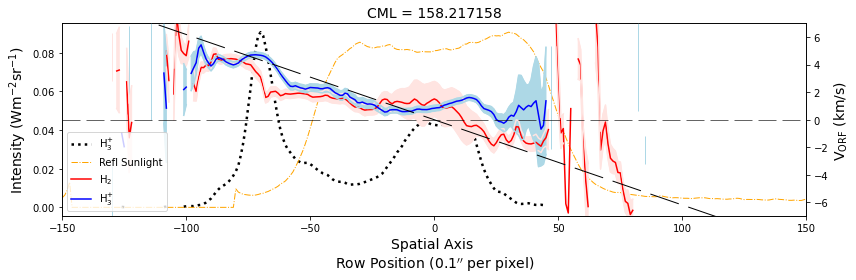

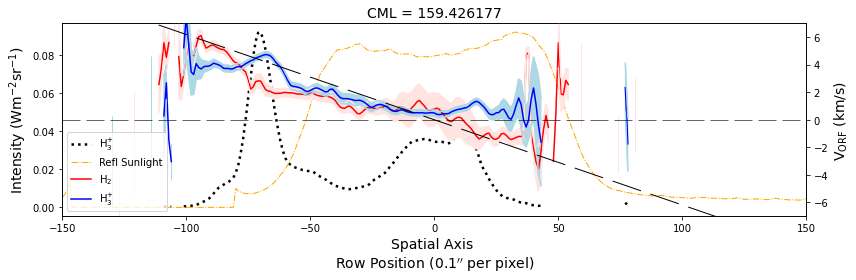

...

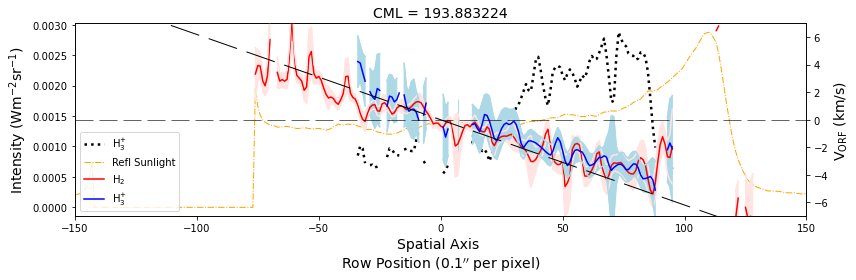

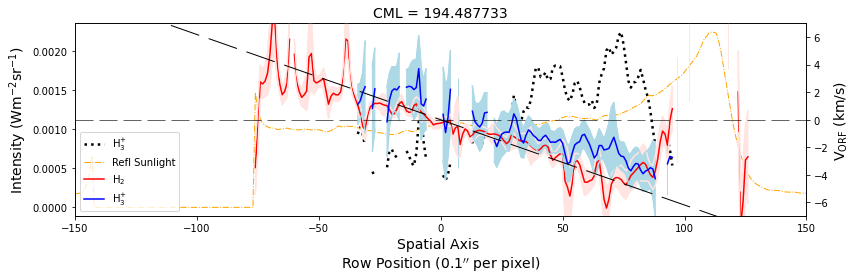

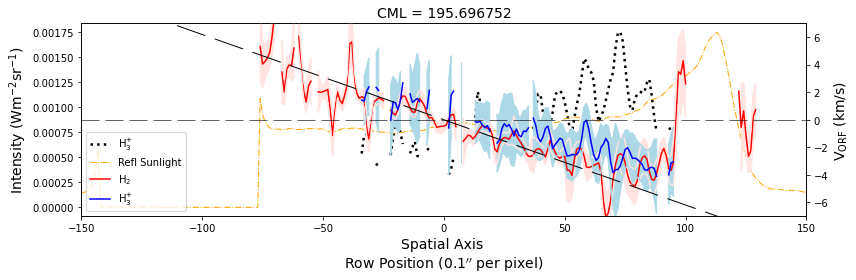

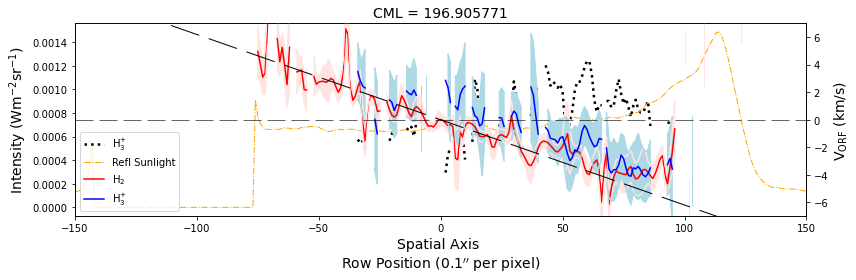

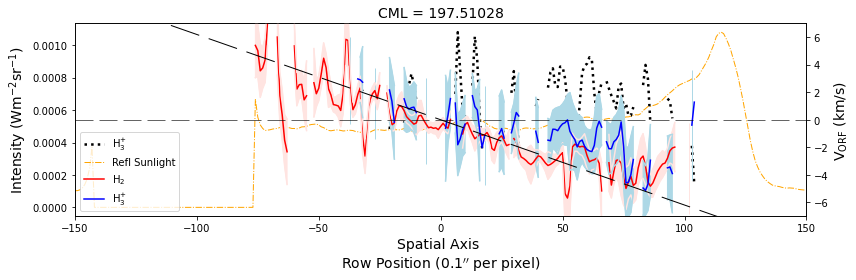

In [8]:
ang_diam = 40.58867
ang_diam/(0.1)
limb_vel = 12.572
vel_slope = limb_vel * 2 / (ang_diam/(0.1))

x = np.linspace(-150,150,301)
rot_rate = vel_slope * x
rot_rate = rot_rate - rot_rate[150]

a2 = h2_vorf*(-1)
b2 = h3p_vorf*(-1)

c2 = b2 - a2

errc2 = np.sqrt((h3p_verr)**2 + (h2_verr)**2)

for i in range(len(h3p_vorf)):
# for i in range(18, 19):
    if i not in (0,15,16,37):  
        xnew = np.linspace(-150,150,301)
        int2 = (ref_sun/np.nanmax(ref_sun[i])*np.nanmax(h3p_int[i]))
        
        fig, ax = plt.subplots(figsize = (12, 4))
        plt.title('CML = '+ str(cml[i]), fontsize=14)
        
        vh2 = a2[i]
        vh2max = a2[i] + h2_verr[i]
        vh2min = a2[i] - h2_verr[i]
        
        vh3p = b2[i]
        vh3pmax = b2[i] + h3p_verr[i]
        vh3pmin = b2[i] - h3p_verr[i]
        
        ax2 = ax.twinx()
        
        ax.plot(xnew, h3p_int[i], color='k', ls=':', label='H$_3^{+}$', lw=2.5)
        ax.plot(xnew, int2[i], color='orange', ls='-.', label='Refl Sunlight', lw=1)
        
        ax2.plot(xnew, vh2, color='red', label='H$_2$')        
        ax2.plot(xnew, vh2max, color='mistyrose')
        ax2.plot(xnew, vh2min, color='mistyrose')
        ax2.fill_between(xnew, vh2min, vh2max, color='mistyrose')
        
        ax2.plot(xnew, vh3p, color='blue', label='H$_3^{+}$')
        ax2.plot(xnew, vh3pmax, color='lightblue')
        ax2.plot(xnew, vh3pmin, color='lightblue')
        ax2.fill_between(xnew, vh3pmin, vh3pmax, color='lightblue')
        
#         ax2.errorbar(xnew, a2[i], yerr=h2_verr[i], color='red', ecolor='lightsalmon', label='H$_2$')
#         ax2.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='blue', ecolor='lightblue', label='H$_3^{+}$')
#         ax2.errorbar(xnew, (a2[i]-vmp[i])/vmp[i], yerr=h2_verr[i], color='red', ecolor='lightsalmon', label='H$_2$')
#         ax2.errorbar(xnew, (b2[i])/rot_rate, yerr=h3p_verr[i], color='blue', ecolor='lightblue', label='H$_3^{+}$')
        ax2.plot(xnew, -rot_rate, color='black', ls='dashed', dashes=(30, 10), lw=1)
#         ax2.errorbar(xnew, c2[i], yerr=errc2[i], color='green', ecolor='lightgreen', label='H$_3^{+}$-H$_2$')
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)

        # secondary y-axis label
        ax2.set_ylabel('V$_{\mathrm{ORF}}$ (km/s)', fontsize=14)
        
#         plt.figure(figsize=(12,4))
#         plt.plot(a2[num], label='H2')
#         plt.plot(b2[num], label='H3+')
#         plt.plot(xnew, int2[i], color='teal', ls='-', label='H$_3^{+}$ - Int')
#         plt.errorbar(xnew, a2[i], yerr=h2_verr[i], color='red', ecolor='gray', label='H$_2$')
#         plt.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='blue', ecolor='lightblue', label='H$_3^{+}$')
        plt.axhline(y=vmp[i]-vmp[i], xmin=0, xmax=1, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.xlim(-150,150)
        plt.ylim(-7,7)
#         plt.xlabel('Spatial Axis \nRaw Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
#         plt.ylabel('V$_{\mathrm{orf}}$ (km/s)', fontsize=14)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=3)
#         
        plt.tight_layout()
        plt.savefig(imgpath+'/h2_h3p_vorf_fr'+str(i)+'.pdf', dpi=400, bbox_inches='tight', facecolor='white')

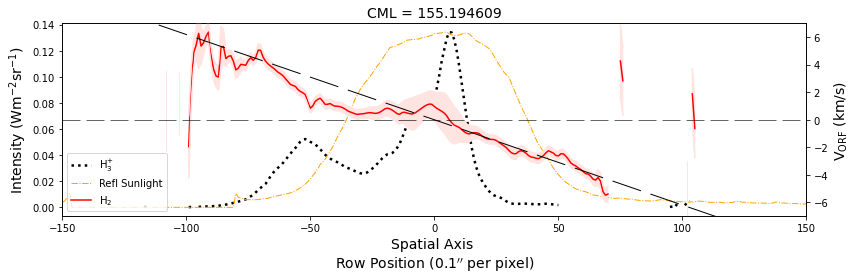

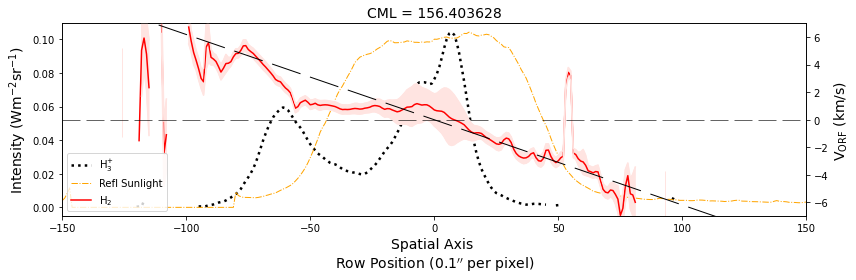

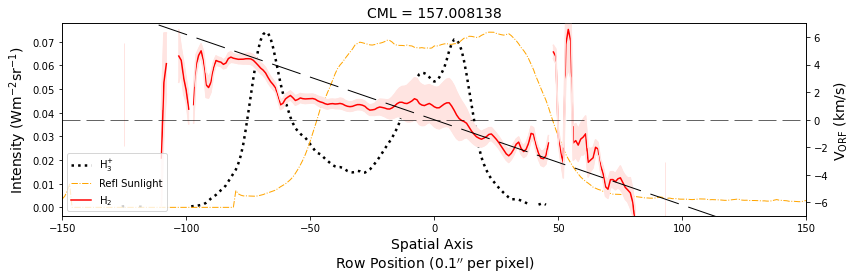

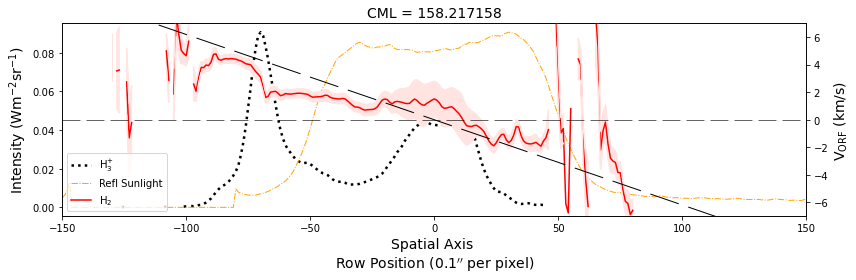

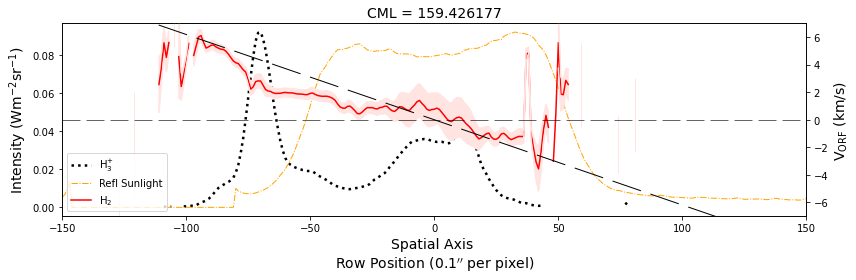

...

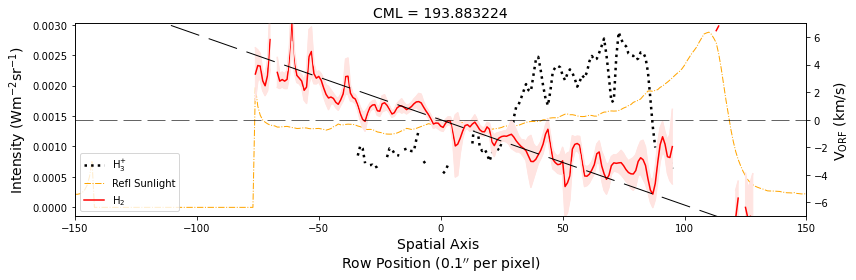

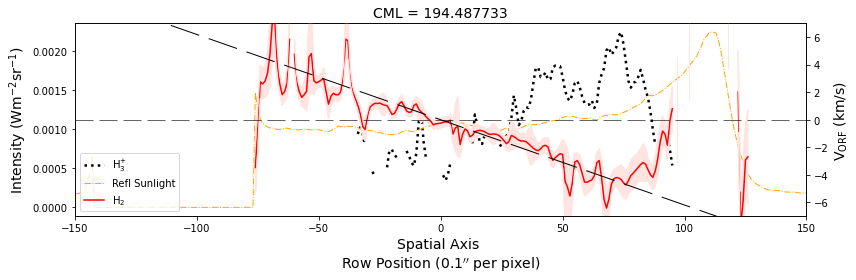

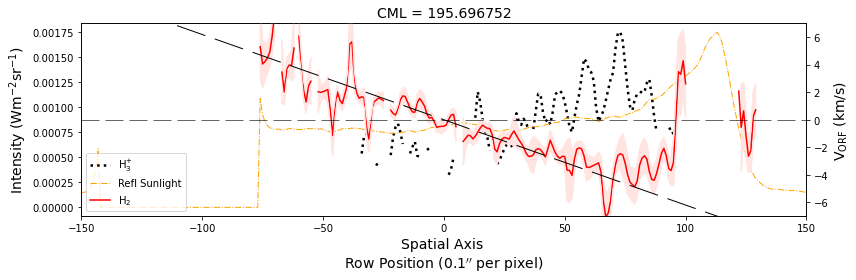

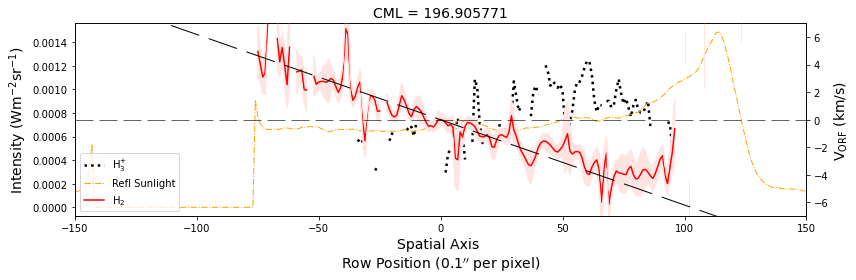

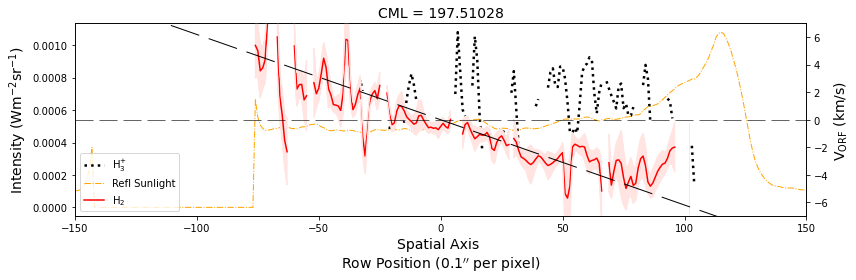

In [9]:
for i in range(len(h3p_vorf)):
# for i in range(18, 19):
    if i not in (0,15,16,37):  
        xnew = np.linspace(-150,150,301)
        int2 = (ref_sun/np.nanmax(ref_sun[i])*np.nanmax(h3p_int[i]))
        
        fig, ax = plt.subplots(figsize = (12, 4))
        plt.title('CML = '+ str(cml[i]), fontsize=14)
        
        vh2 = a2[i]
        vh2max = a2[i] + h2_verr[i]
        vh2min = a2[i] - h2_verr[i]
        
        vh3p = b2[i]
        vh3pmax = b2[i] + h3p_verr[i]
        vh3pmin = b2[i] - h3p_verr[i]
        
        ax2 = ax.twinx()
        
        ax.plot(xnew, h3p_int[i], color='k', ls=':', label='H$_3^{+}$', lw=2.5)
        ax.plot(xnew, int2[i], color='orange', ls='-.', label='Refl Sunlight', lw=1)
        
        ax2.plot(xnew, vh2, color='red', label='H$_2$')        
        ax2.plot(xnew, vh2max, color='mistyrose')
        ax2.plot(xnew, vh2min, color='mistyrose')
        ax2.fill_between(xnew, vh2min, vh2max, color='mistyrose')
        
#         ax2.plot(xnew, vh3p, color='blue', label='H$_3^{+}$')
#         ax2.plot(xnew, vh3pmax, color='lightblue')
#         ax2.plot(xnew, vh3pmin, color='lightblue')
#         ax2.fill_between(xnew, vh3pmin, vh3pmax, color='lightblue')
        
        ax2.plot(xnew, -rot_rate, color='black', ls='dashed', dashes=(30, 10), lw=1)
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)

        # secondary y-axis label
        ax2.set_ylabel('V$_{\mathrm{ORF}}$ (km/s)', fontsize=14)
        
        plt.axhline(y=vmp[i]-vmp[i], xmin=0, xmax=1, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.xlim(-150,150)
        plt.ylim(-7,7)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=3)
        
        plt.tight_layout()
        plt.savefig(imgpath+'/h2_vorf_fr'+str(i)+'.pdf', dpi=400, bbox_inches='tight', facecolor='white')

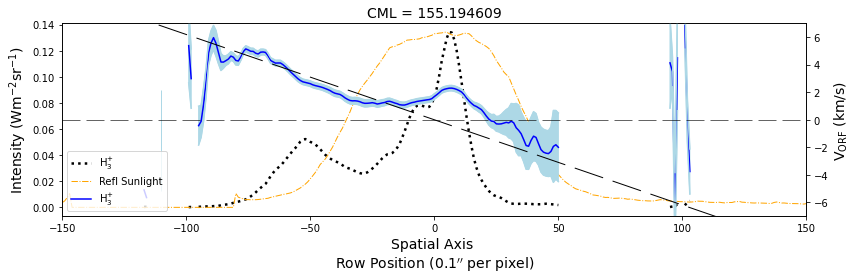

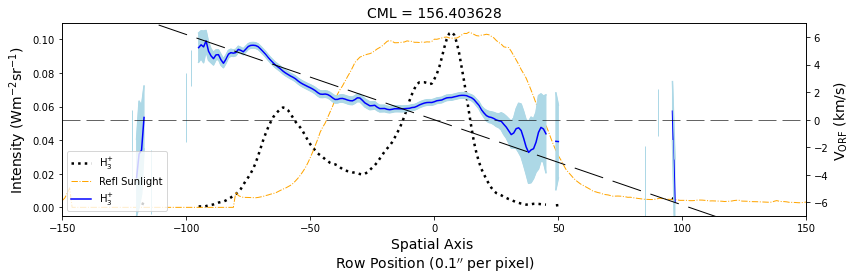

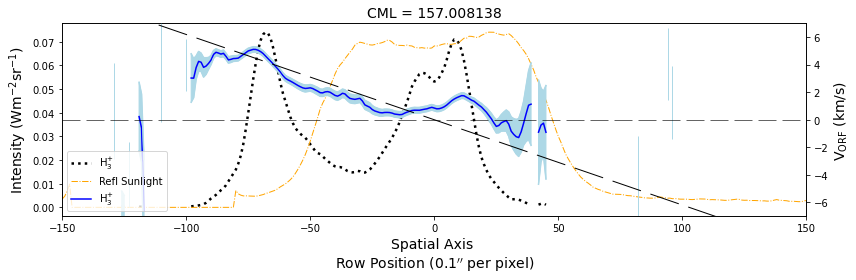

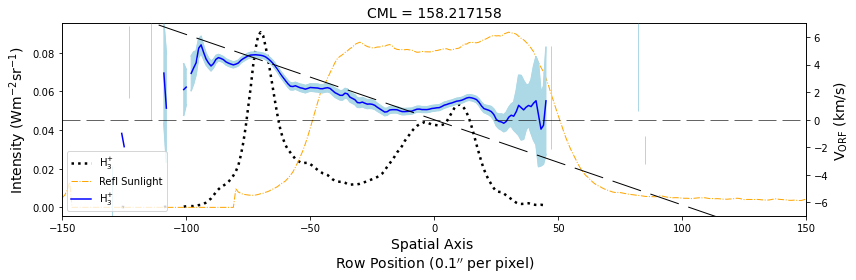

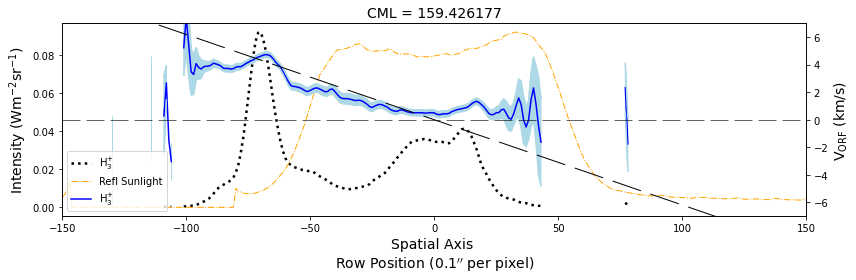

...

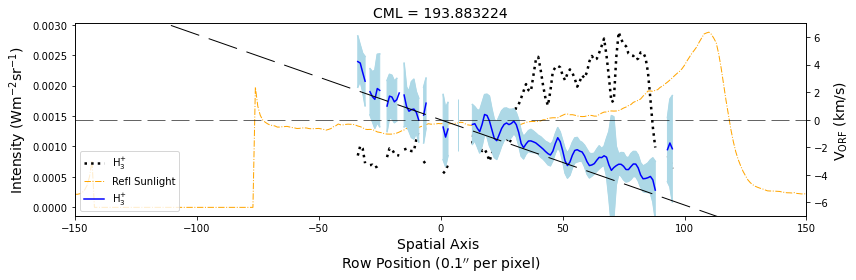

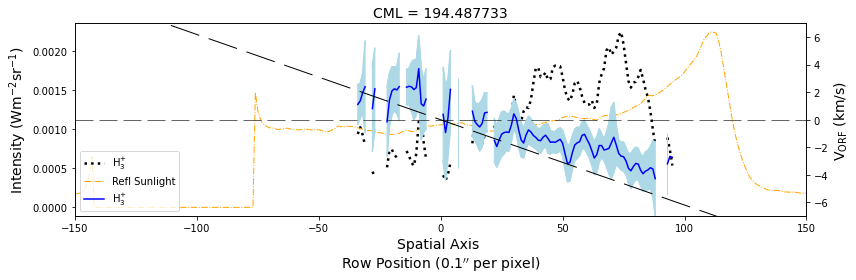

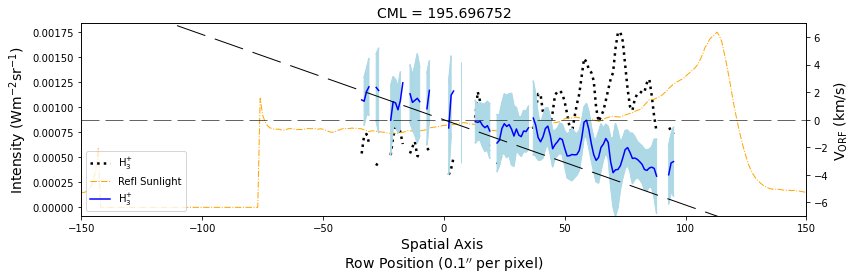

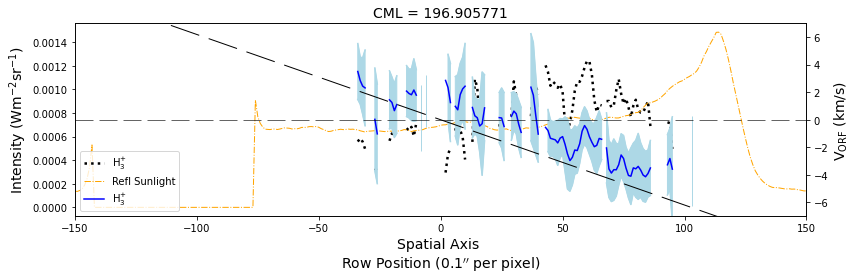

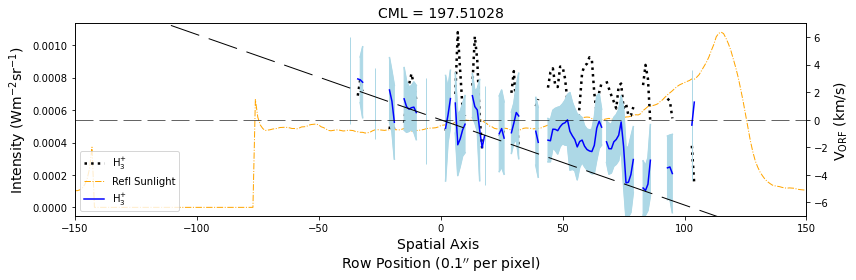

In [10]:
for i in range(len(h3p_vorf)):
# for i in range(18, 19):
    if i not in (0,15,16,37):  
        xnew = np.linspace(-150,150,301)
        int2 = (ref_sun/np.nanmax(ref_sun[i])*np.nanmax(h3p_int[i]))
        
        fig, ax = plt.subplots(figsize = (12, 4))
        plt.title('CML = '+ str(cml[i]), fontsize=14)
        
        vh2 = a2[i]
        vh2max = a2[i] + h2_verr[i]
        vh2min = a2[i] - h2_verr[i]
        
        vh3p = b2[i]
        vh3pmax = b2[i] + h3p_verr[i]
        vh3pmin = b2[i] - h3p_verr[i]
        
        ax2 = ax.twinx()
        
        ax.plot(xnew, h3p_int[i], color='k', ls=':', label='H$_3^{+}$', lw=2.5)
        ax.plot(xnew, int2[i], color='orange', ls='-.', label='Refl Sunlight', lw=1)
        
#         ax2.plot(xnew, vh2, color='red', label='H$_2$')        
#         ax2.plot(xnew, vh2max, color='mistyrose')
#         ax2.plot(xnew, vh2min, color='mistyrose')
#         ax2.fill_between(xnew, vh2min, vh2max, color='mistyrose')
        
        ax2.plot(xnew, vh3p, color='blue', label='H$_3^{+}$')
        ax2.plot(xnew, vh3pmax, color='lightblue')
        ax2.plot(xnew, vh3pmin, color='lightblue')
        ax2.fill_between(xnew, vh3pmin, vh3pmax, color='lightblue')
        
        ax2.plot(xnew, -rot_rate, color='black', ls='dashed', dashes=(30, 10), lw=1)
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)

        # secondary y-axis label
        ax2.set_ylabel('V$_{\mathrm{ORF}}$ (km/s)', fontsize=14)
        
        plt.axhline(y=vmp[i]-vmp[i], xmin=0, xmax=1, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.xlim(-150,150)
        plt.ylim(-7,7)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=3)
        
        plt.tight_layout()
        plt.savefig(imgpath+'/h3p_vorf_fr'+str(i)+'.pdf', dpi=400, bbox_inches='tight', facecolor='white')

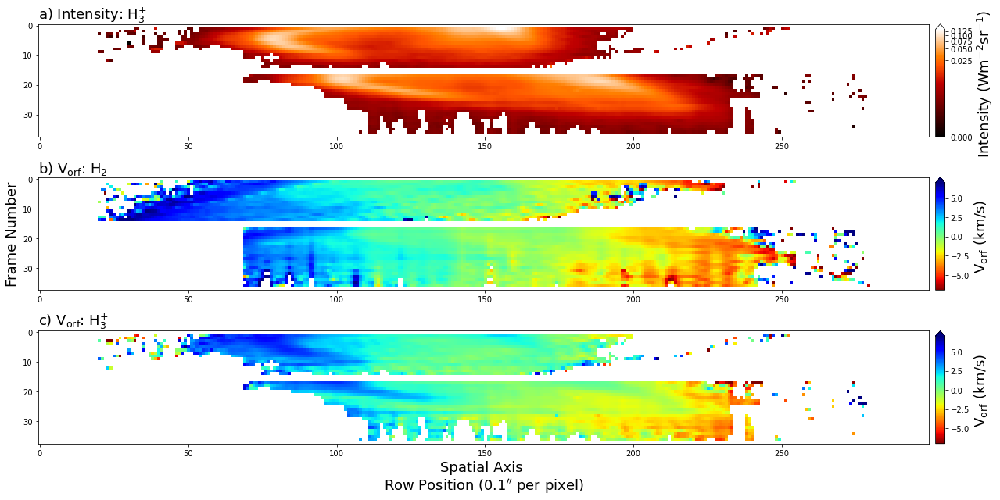

In [6]:
fig = plt.figure(figsize=(24,9), tight_layout=True)

fig.add_subplot(311)
plt.imshow(h3p_int, cmap='gist_heat', norm=colors.PowerNorm(gamma=0.2))
# plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=18)
# plt.ylabel('Frame Number', fontsize=18)
plt.title('a) Intensity: H$_3^{+}$', loc='left', fontsize=18)
plt.colorbar(extend='max', aspect=12, pad=0.005).set_label(label='Intensity (Wm$^{-2}$sr$^{-1}$)',size=18)

fig.add_subplot(312)
plt.imshow(a2, cmap='jet_r', vmin=-7, vmax=7)
# plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=18)
plt.ylabel('Frame Number', fontsize=18)
plt.title('b) V$_{\mathrm{orf}}$: H$_2$', loc='left', fontsize=18)
plt.colorbar(extend='max', aspect=12, pad=0.005).set_label(label='V$_{\mathrm{orf}}$ (km/s)',size=18)

fig.add_subplot(313)
plt.imshow(b2, cmap='jet_r', vmin=-7, vmax=7)
plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=18)
# plt.ylabel('Frame Number', fontsize=24)
plt.title('c) V$_{\mathrm{orf}}$: H$_3^{+}$', loc='left', fontsize=18)
plt.colorbar(extend='max', aspect=12, pad=0.005).set_label(label='V$_{\mathrm{orf}}$ (km/s)',size=18)

# fig.add_subplot(514)
# plt.imshow(c3, cmap='jet_r', vmin=-1.5, vmax=3.5)
# # plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=18)
# # plt.ylabel('Frame Number', fontsize=18, alpha=0)
# plt.title('d) V$_{\mathrm{orf}}$: H$_3^{+}$ - H$_2$', loc='left', fontsize=18)
# plt.colorbar(extend='max', aspect=12, pad=0.005).set_label(label='V$_{\mathrm{orf}}$ (km/s)',size=18)

# fig.add_subplot(515)
# plt.imshow(e3, cmap='jet_r', vmin=-2, vmax=2)
# plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=24)
# plt.ylabel('Frame Number', fontsize=10, alpha=0)
# plt.title('e) V$_{\mathrm{orf}}$: H$_3^{+}$ - H$_2$ ($\mathrm{min}$)', loc='left', fontsize=18)
# plt.colorbar(extend='max', aspect=12, pad=0.005).set_label(label='V$_{\mathrm{orf}}$ (km/s)',size=18)

# fig.supxlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=18)
# fig.supylabel('Frame Number', fontsize=18)
# plt.savefig(imgpath + '/h2_h3p_int_vel_curr_map', dpi=400, bbox_inches='tight', facecolor='white')

d2 = a2 / b2
d2[d2 > 1.5] = np.nan
d2[d2 < -1.5] = np.nan

errd2 = d2 * np.sqrt((h2_verr / a2)**2 + (h3p_verr / b2)**2)

for i in range(len(h3p_vorf)):
    if i not in (0,15,16,37):  
        xnew = np.linspace(0,299,300)
        int2 = (ref_sun/np.nanmax(ref_sun[i])*np.nanmax(h3p_int[i]))
        
        fig, ax = plt.subplots(figsize = (12, 4))
        plt.title('Frame Number = '+ str(i), fontsize=14)
        
        ax2 = ax.twinx()
        ax.plot(xnew, h3p_int[i], color='k', ls=':', label='H$_3^{+}$', lw=2.5)
        ax.plot(xnew, int2[i], color='orange', ls='-.', label='Sun', lw=1)
#         ax2.errorbar(xnew, a2[i], yerr=h2_verr[i], color='red', ecolor='lightsalmon', label='H$_2$')
#         ax2.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='blue', ecolor='lightblue', label='H$_3^{+}$')
        ax2.errorbar(xnew, d2[i], yerr=errd2[i], color='blueviolet', ecolor='thistle', label='H$_2$ / H$_3^{+}$')
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)

        # secondary y-axis label
        ax2.set_ylabel('L factor', fontsize=14)
        plt.axhline(y=0, xmin=0, xmax=250, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.xlim(0,250)
        plt.ylim(-1.5,1.5)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=0)
        
        plt.tight_layout()
        plt.savefig(imgpath + '/h2_h3p_l_fr_' +str(i), dpi=400, bbox_inches='tight', facecolor='white')